In [36]:
import time

import cv2
import ipyplot
import numpy as np
import pandas as pd
from typing import Union
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from tools.utils import read_hsi, get_color_map

%matplotlib inline

In [21]:
def normalize_image(
        image: np.ndarray,
        target_min: Union[int, float] = 0.0,
        target_max: Union[int, float] = 1.0,
        target_type=np.float32,
) -> Union[int, float]:
    a = (target_max - target_min) / (image.max() - image.min())
    b = target_max - a * image.max()
    image_norm = (a * image + b).astype(target_type)
    return image_norm

In [22]:
hsi_path = 'dataset/HSI/29_08_2019_test_01_liver/10_00_12_T1=NA/SpecCube.dat'
modality = 'absorbance'

In [23]:
hsi_ = read_hsi(
    path=hsi_path,
    data_type=modality,
)
hsi_height, hsi_width, hsi_bands = hsi_.shape
hsi = hsi_.reshape(hsi_height * hsi_width, hsi_bands)

In [24]:
X_ = pd.DataFrame(hsi)
X = StandardScaler().fit_transform(X_)

#### Principal Component Analysis

In [25]:
num_components = 9
columns = [f'PC{idx+1}' for idx in range(num_components)]
pca = PCA(n_components=num_components)
principal_components = pca.fit_transform(X)
df_pca = pd.DataFrame(data=principal_components, columns=columns)
var_ratio_ = list(pca.explained_variance_ratio_)
var_ratio = [f'{x:.2%}' for x in var_ratio_]
print(f'Explained variation per principal component: {var_ratio}')

Explained variation per principal component: ['94.74%', '2.74%', '1.28%', '0.24%', '0.14%', '0.12%', '0.08%', '0.06%', '0.05%']



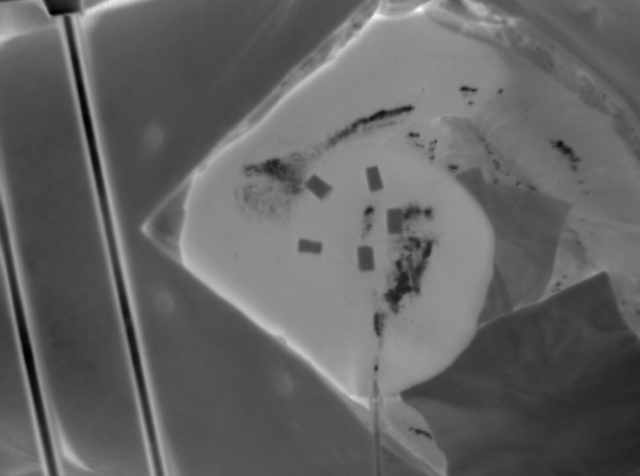
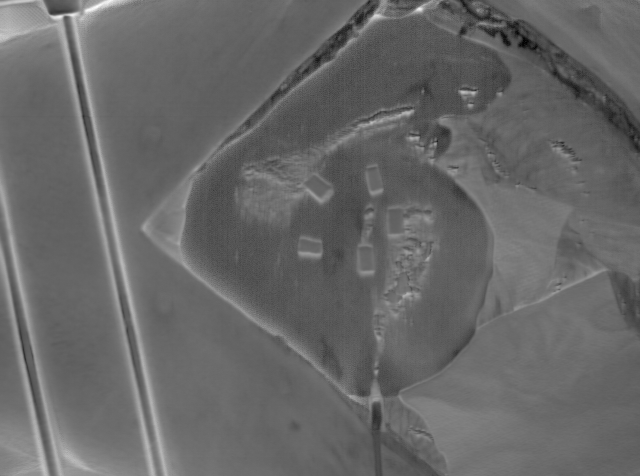
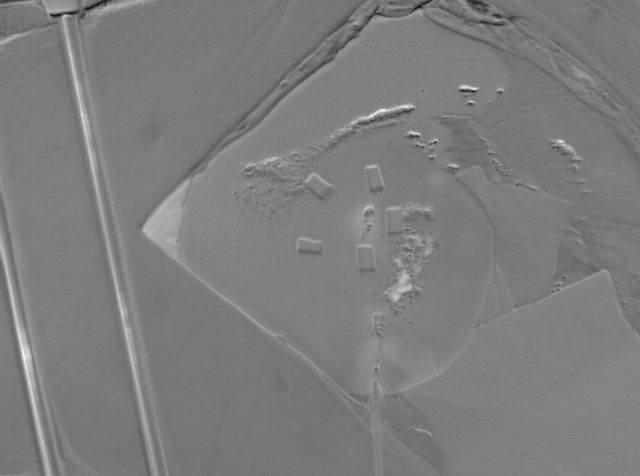
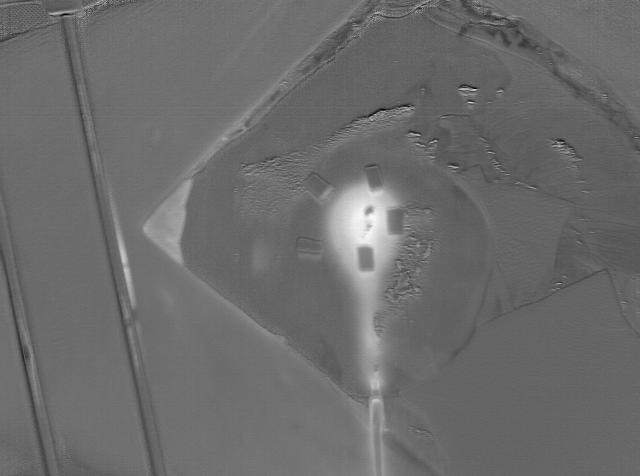
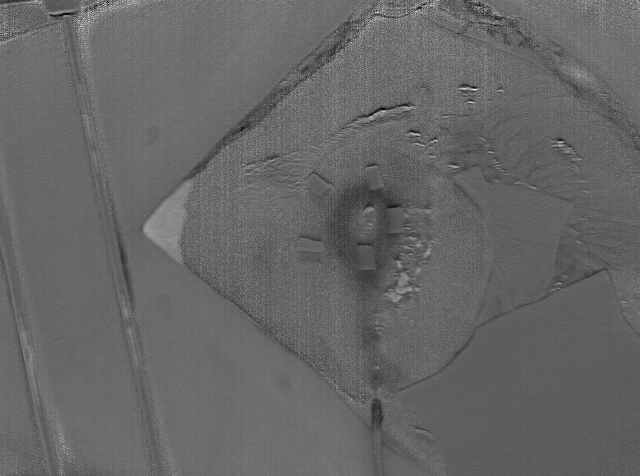
...
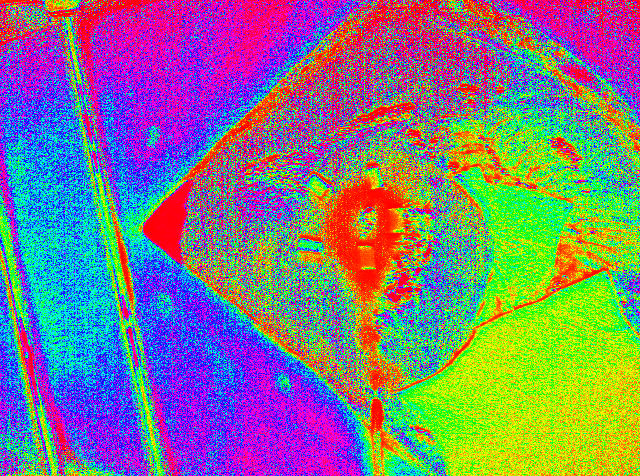
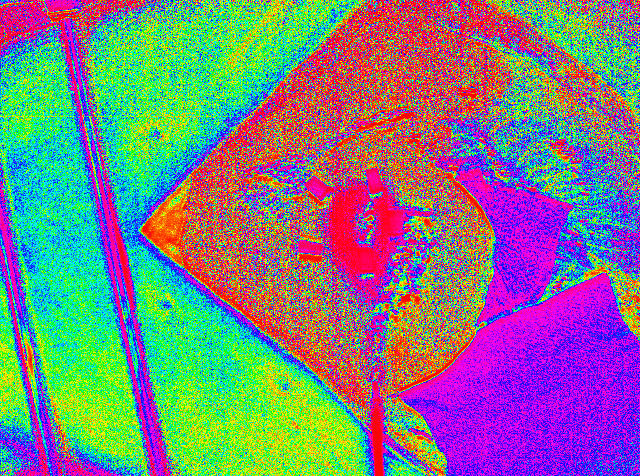
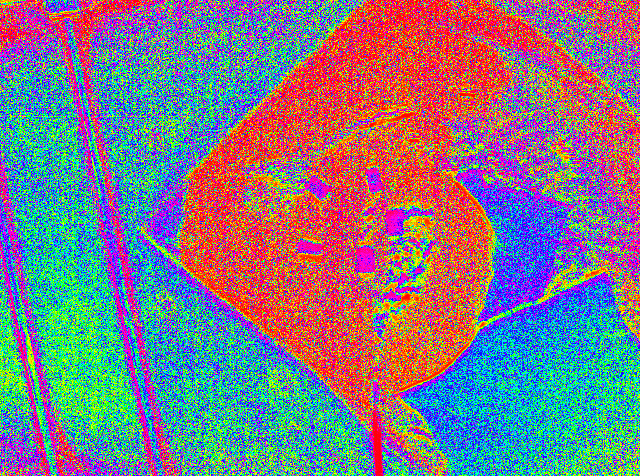
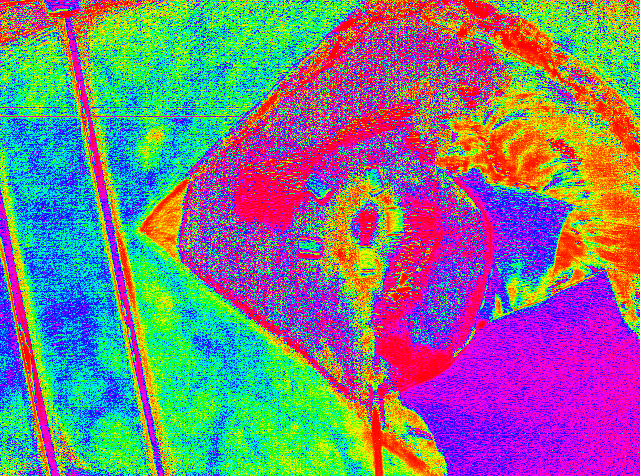
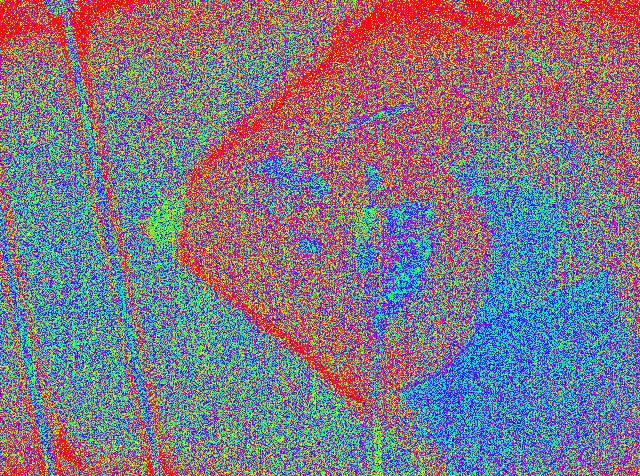

In [26]:
color_map = 'hsv'

images = {}
images_color = {}
for idx in range(num_components):
    img = df_pca.iloc[:, idx].values
    img = img.reshape(hsi_height, hsi_width)
    img = normalize_image(
        image=img,
        target_min=0,
        target_max=255,
        target_type=np.uint8,
        )
    images[f'PC{idx+1}'] = img
    
    img_color = cv2.equalizeHist(img)
    cmap = get_color_map(color_map)
    img_color = cv2.applyColorMap(img_color, cmap)
    img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
    images_color[f'PC{idx+1}'] = img_color
    
ipyplot.plot_images(
    images=list(images.values()),
    labels=list(images.keys()),
    custom_texts=var_ratio,
    max_images=num_components,
    img_width=450,
    )

ipyplot.plot_images(
    images=list(images_color.values()),
    labels=list(images_color.keys()),
    custom_texts=var_ratio,
    max_images=num_components,
    img_width=450,
    )

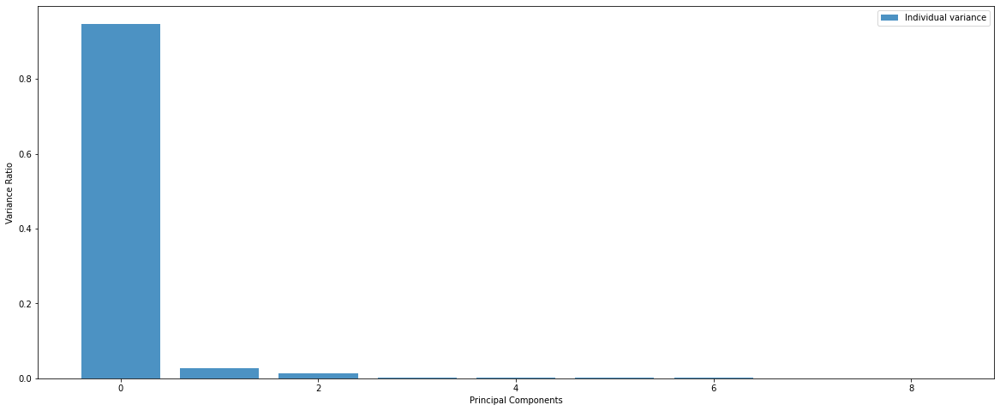

In [44]:
plt.figure(figsize=(20, 8))
plt.bar(
    range(num_components),
    var_ratio_,
    alpha=0.8,
    align='center',
    label='Individual variance',
    )
plt.legend()
plt.ylabel('Variance Ratio')
plt.xlabel('Principal Components')
plt.show()